# 0. Giới thiệu
Dữ liệu dành cho bài lab này là tập ảnh chứa trong một folder.
Các file ảnh có định dạng png và tên file sẽ dùng làm định danh cho các file ảnh.
Trước tiên, duyệt tất cả các file đang có, lưu danh sách tên file và hiển thị một vài ảnh để hình dung dữ liệu đang có.

In [1]:
import os
import glob
path = r"../data/flower_images"
filelist = glob.glob(path+'/*.png')
filelist.sort()
print("Number of images: " + str(len(filelist)))
print("Sample filenames: " + str(filelist[0:3]))

Number of images: 210
Sample filenames: ['../data/flower_images/0001.png', '../data/flower_images/0002.png', '../data/flower_images/0003.png']


# 1. Khám phá dữ liệu
**Trực quan dữ liệu**
Hiển thị 18 ảnh đầu tiên. Dùng subplot hiển thị lưới gồm 3 hàng, 6 cột.


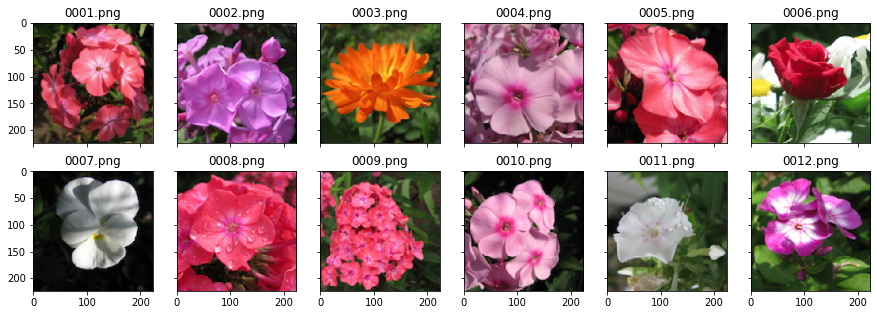

In [2]:
# for loading/processing the images
# !pip install tensorflow, keras, pillow, sklearn, pandas
from keras.preprocessing.image import load_img
import matplotlib.pyplot as plt

n_cols=6
n_rows=2
n_img = n_cols*n_rows
fig, axs = plt.subplots(n_rows, n_cols, figsize=[15,5], sharex=True, sharey=True)

for i in range(n_img):
    # load the image as a 224x224 array
    img = load_img(filelist[i], target_size=(224,224))
    i_row, i_col = divmod(i, n_cols)
    axs[i_row, i_col].imshow(img)
    axs[i_row, i_col].set_title(filelist[i][-8:])
plt.show()

**Lưu ý, tập dữ liệu này đã được gán nhãn. Mỗi file ảnh sẽ được ánh xạ bởi 1 loại (class) hoa khác nhau. 
Đây là điều rất tốt cho khâu đánh giá giải pháp gom cụm.
Trước tiên, chúng ta thử nạp file chứa nhãn dữ liệu để có cái nhìn đầu tiên.**

In [4]:
import pandas as pd
# get the unique labels (from the flower_labels.csv)
df = pd.read_csv('../data/flower_labels.csv')
labels = df['label'].tolist()
unique_labels = list(set(labels))
print("Labels: "+  str(labels))
print("Unique Labels: " + str(unique_labels))

Labels: [0, 0, 2, 0, 0, 1, 6, 0, 0, 0, 0, 0, 0, 7, 7, 1, 0, 0, 6, 0, 2, 4, 7, 4, 5, 6, 2, 5, 6, 6, 3, 6, 5, 0, 3, 8, 5, 9, 2, 8, 9, 1, 7, 3, 1, 4, 7, 3, 8, 1, 3, 4, 7, 9, 3, 6, 5, 8, 6, 8, 2, 1, 7, 8, 0, 5, 6, 3, 6, 4, 9, 7, 9, 1, 5, 3, 6, 6, 8, 3, 1, 4, 3, 9, 8, 5, 2, 4, 6, 4, 7, 1, 5, 2, 1, 5, 8, 5, 8, 3, 1, 2, 4, 5, 1, 2, 8, 3, 8, 3, 5, 4, 2, 9, 5, 0, 8, 6, 0, 8, 5, 2, 4, 5, 8, 3, 2, 0, 8, 6, 9, 2, 8, 4, 5, 8, 0, 6, 2, 4, 9, 4, 5, 5, 2, 7, 8, 4, 9, 3, 2, 4, 7, 5, 9, 3, 1, 8, 1, 3, 6, 9, 1, 2, 8, 2, 7, 9, 9, 5, 9, 8, 3, 9, 8, 5, 1, 4, 2, 7, 0, 5, 8, 6, 3, 9, 6, 1, 3, 7, 4, 7, 1, 9, 8, 3, 6, 5, 6, 4, 1, 3, 8, 5, 4, 6, 0, 4, 6, 1]
Unique Labels: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


Ở đây có 10 loại nhãn, đánh số từ 0-9, tương ứng với 10 loại hoa khác nhau.
Thử hiển thị các file ảnh theo các nhóm.

Label 0:


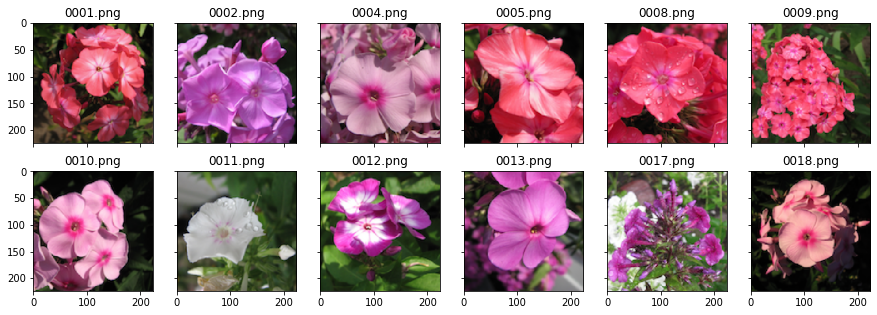

Label 1:


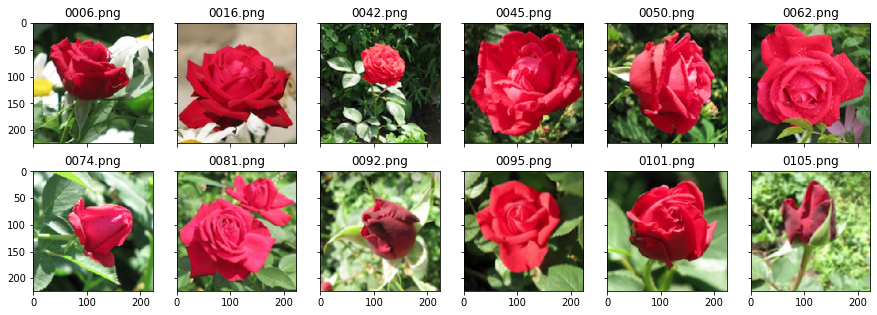

Label 2:


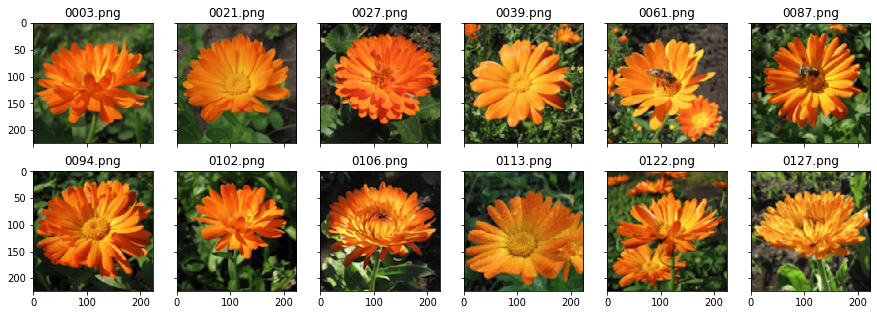

Label 3:


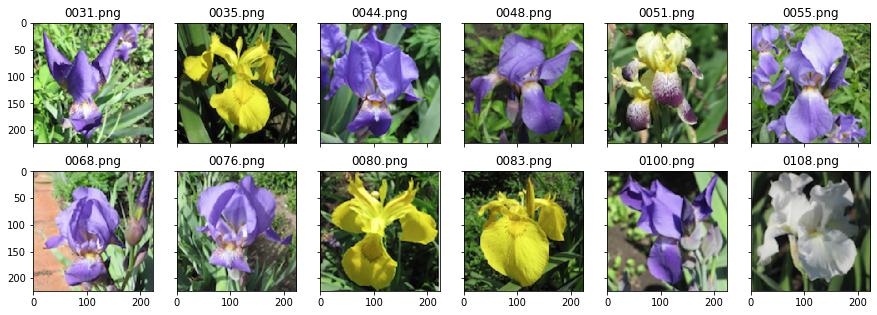

Label 4:


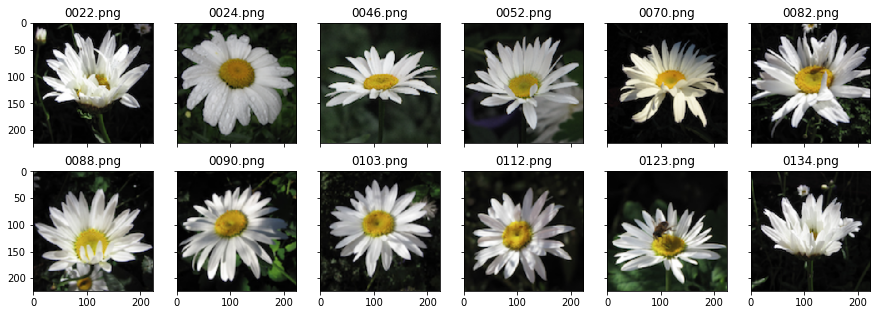

Label 5:


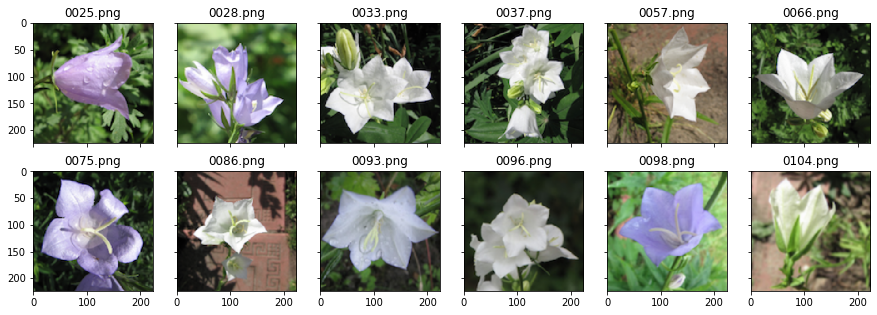

Label 6:


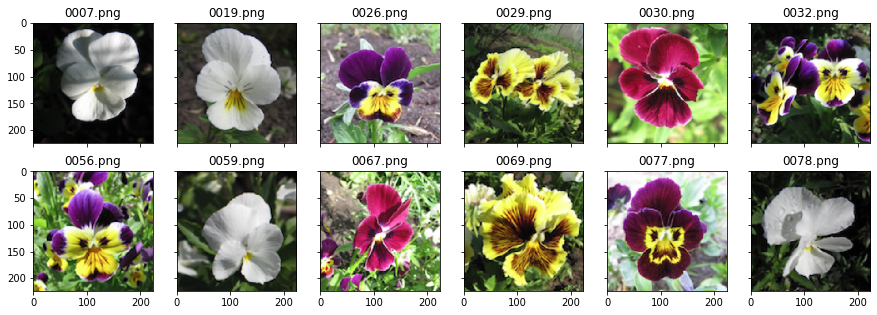

Label 7:


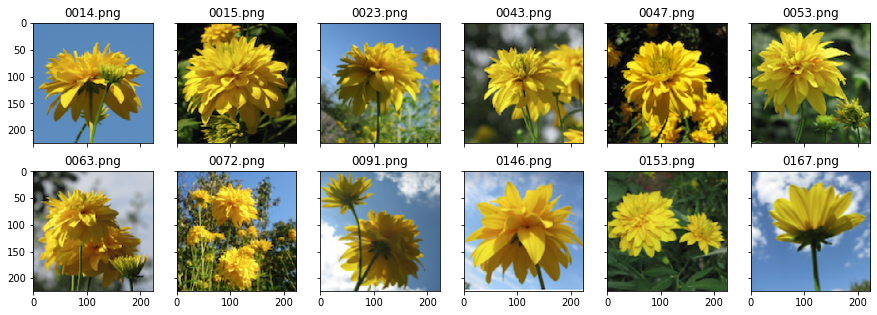

Label 8:


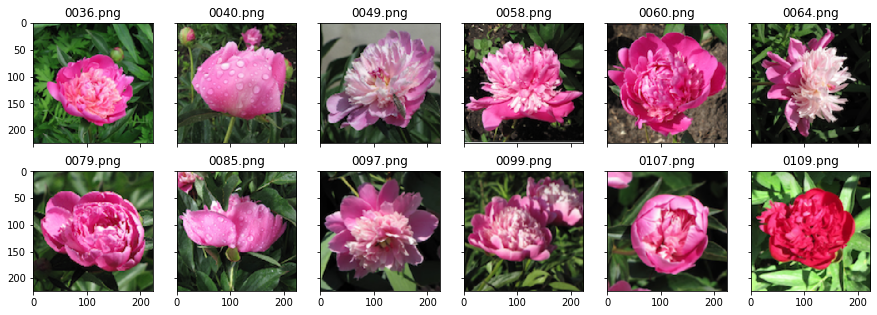

Label 9:


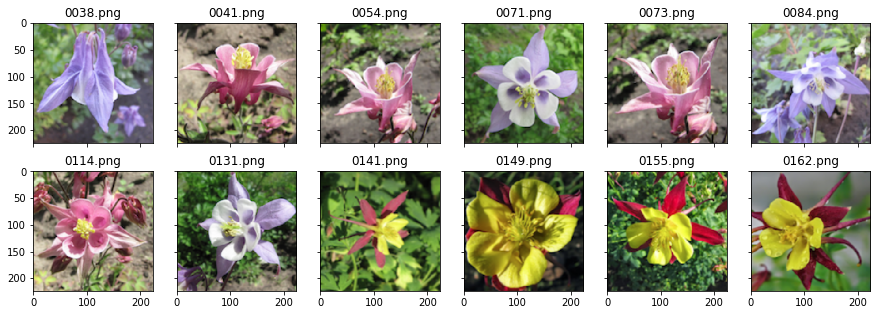

In [5]:
def show_mul_imgs(filenames, n_cols=6, n_rows=2):
    n_img = n_cols*n_rows
    if n_img>len(filenames):
        n_img=len(filenames)
    fig, axs = plt.subplots(n_rows, n_cols, figsize=[15,5], sharex=True, sharey=True)

    for i in range(n_img):
        # load the image as a 224x224 array
        img = load_img(filenames[i], target_size=(224,224))
        i_row, i_col = divmod(i, n_cols)
        axs[i_row, i_col].imshow(img)
        axs[i_row, i_col].set_title(filenames[i][-8:])
    plt.show()

for c in unique_labels:
    print("Label {}:".format(c))
    filtered_list = [filelist[i] for i in range(len(filelist)) if labels[i]==c]
    show_mul_imgs(filtered_list)


# 2. Thử nghiệm gom cụm với dữ liệu thô

Phần này chúng ta xem các điểm ảnh là các đặc trưng (feature) và dựa trên các đặc trưng này để thực hiện gom cụm

In [80]:
#First attempt: clustering based on Raw Image data
import numpy as np
img = load_img(filelist[0], target_size=(224,224))
img = np.array(img)
print(img.shape)
img = img.reshape(-1)
print(img.shape)

(224, 224, 3)
(150528,)


In [89]:
raw_features = []
for i in range(len(filelist)):
    # load the image as a 224x224 array
    clear_output(wait=True)
    print("Processing "+ str(i)+'/'+str(len(filelist)) + ": " + filelist[i])
    img = load_img(filelist[i], target_size=(224,224))
    img = np.array(img).reshape(-1)
    raw_features.append(img)
raw_features = np.array(raw_features)
print(raw_features.shape)

Processing 209/210: ../data/flower_images/0210.png
(210, 150528)


Do bài lab này tập trung vào khía cách trích xuất đặc trưng chứ không phải giải thuật gom cụm, nên để đơn giản, chúng ta dùng giải thuật gom cụm KMeans. Hoàn toàn có thể thay thế bằng các giải thuật gom cụm khác.

In [90]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=len(unique_labels))
kmeans.fit(raw_features)
predicted_labels = kmeans.labels_
print(predicted_labels)

[3 6 0 4 6 9 7 6 6 1 7 7 6 8 0 2 2 7 1 4 0 7 2 1 7 2 0 4 3 2 4 7 5 7 3 7 7
 4 0 7 4 3 3 4 0 7 0 4 4 0 3 7 3 4 4 2 4 1 7 6 0 6 2 7 7 7 2 4 3 7 4 2 4 2
 1 4 8 1 6 3 2 1 0 4 7 7 0 5 2 1 8 2 1 0 0 5 7 4 7 4 2 0 1 4 2 0 7 1 2 4 1
 5 0 4 1 1 6 4 7 1 4 0 5 7 3 4 0 1 7 8 4 0 4 7 7 6 6 3 0 1 3 1 7 7 0 8 7 7
 0 3 0 5 3 5 3 4 0 7 3 4 7 2 3 3 7 2 8 3 3 7 2 3 7 3 1 7 2 7 3 0 3 5 7 2 4
 7 2 4 3 0 1 3 6 4 6 0 3 1 3 7 0 4 1 3 1 2 1 1 4 3]


Số lượng ảnh chỉ 210 là không lớn, tuy nhiên thời gian gom cụm khá chậm do số đặc trưng thuộc tính dùng cho mỗi ảnh là rất lớn. (Có bao nhiêu thuộc tính?)
Tưởng tượng nếu số lượng ảnh là hàng ngàn hay hàng triệu ảnh...


Tuy nhiên, ở đây đã có kết quả nên ta thử hiển thị các ảnh trong các cụm tìm được.

Label 0:


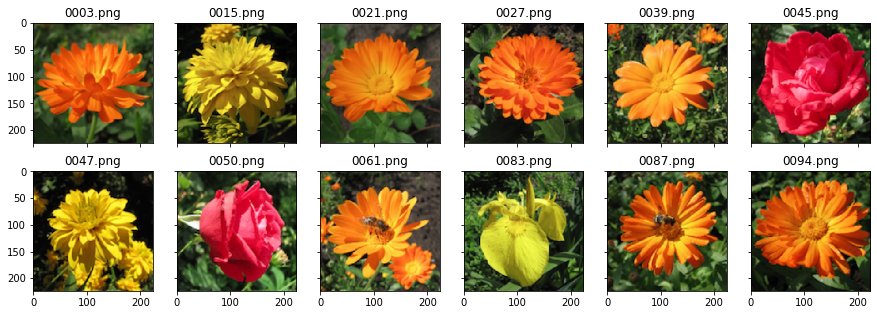

Label 1:


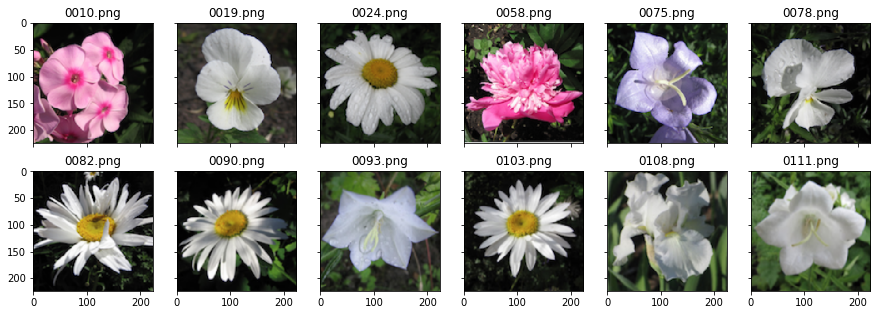

Label 2:


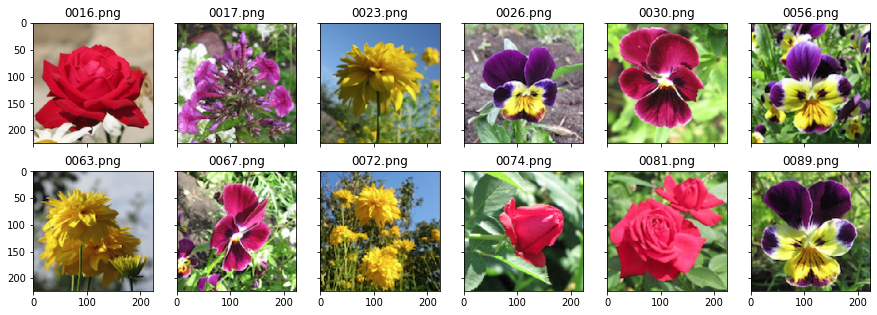

Label 3:


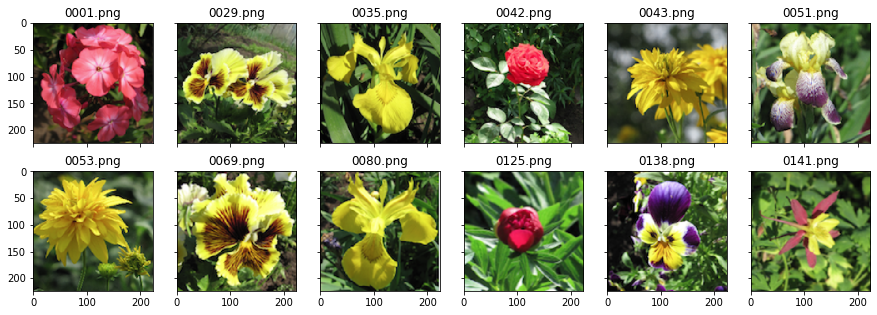

Label 4:


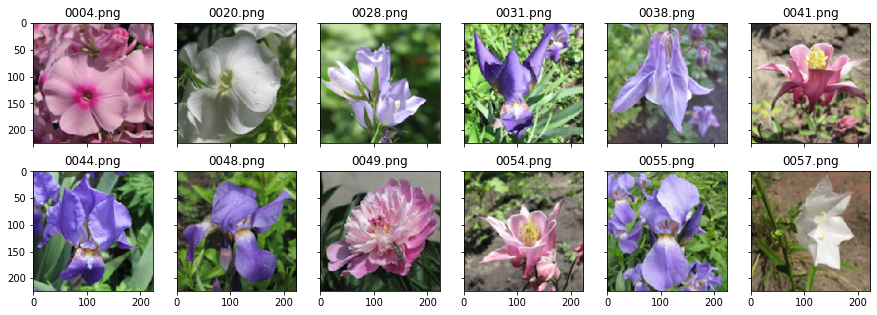

Label 5:


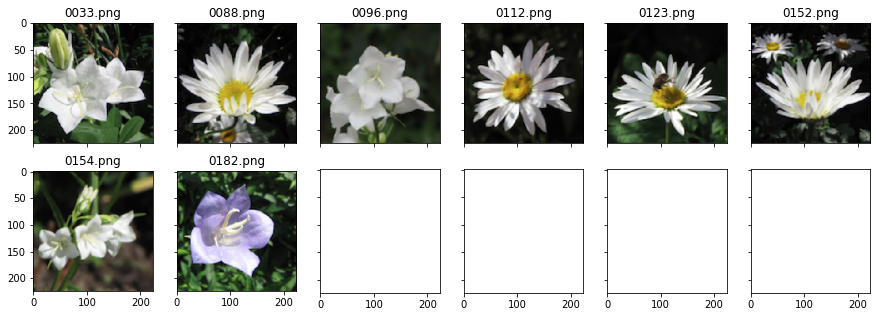

Label 6:


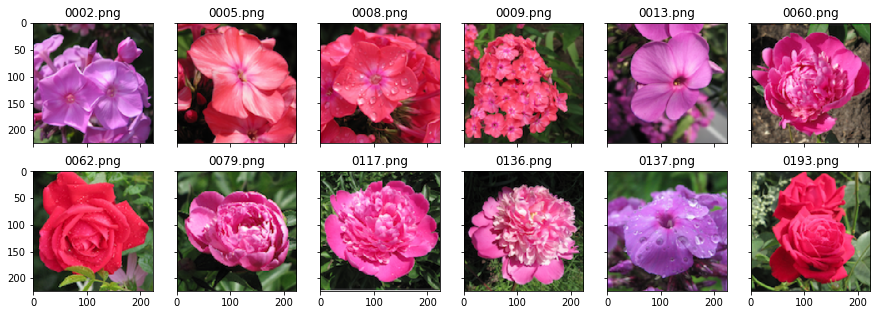

Label 7:


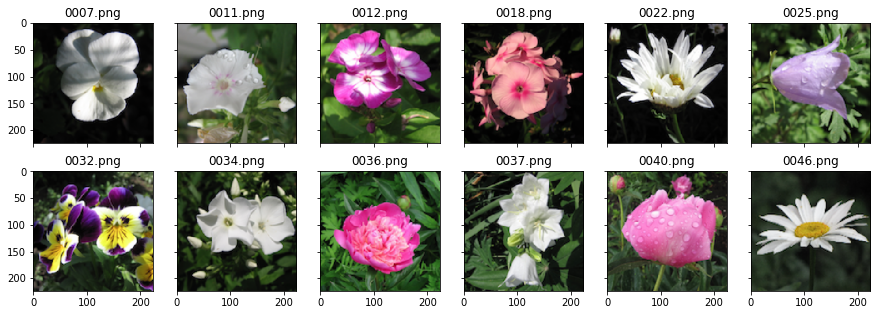

Label 8:


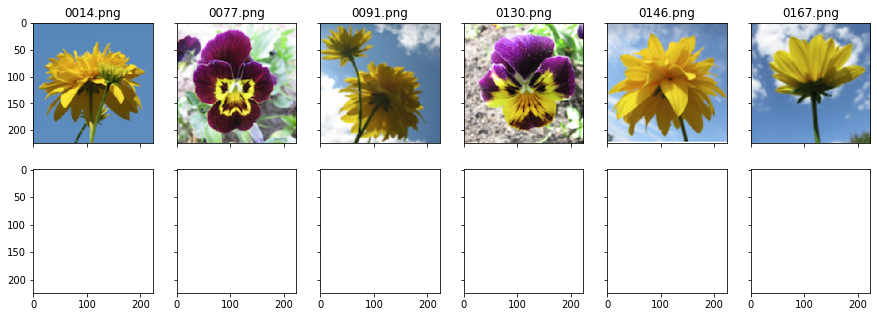

Label 9:


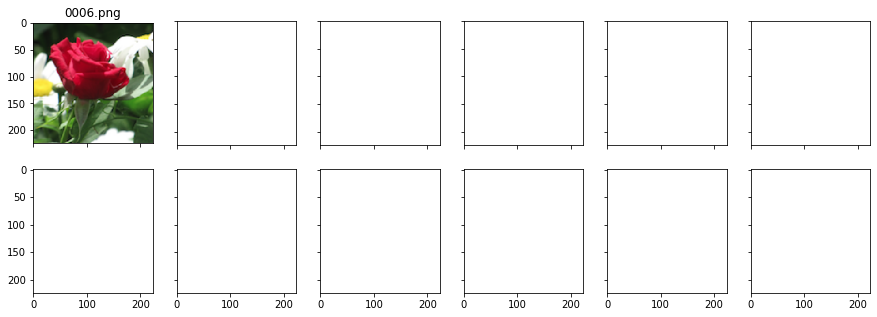

In [94]:
for c in unique_labels:
    print("Label {}:".format(c))
    filtered_list = [filelist[i] for i in range(len(filelist)) if predicted_labels[i]==c]
    show_mul_imgs(filtered_list)


Rõ ràng kết quả clustering là không tốt. 

Chúng ta thử đánh giá dùng các độ đo và dựa vào labels đã có. 
Kết quả gom cụm là tốt nếu trong một cụm gồm chỉ một loại hoa.

Để có thể đánh giá một cách định tính, chúng ta dựa vào các độ đo có dùng thông tin nhãn. 

In [96]:
from sklearn import metrics
def eval_clusters():
    print("Rand score: {}".format(metrics.rand_score(labels, predicted_labels)))
    print("Adjusted RS: {}".format(metrics.adjusted_rand_score(labels, predicted_labels)))
    print("Adjusted MI: {}".format(metrics.adjusted_mutual_info_score(labels, predicted_labels)))
    
eval_clusters()

Rand score: 0.8266119845067214
Adjusted RS: 0.15209441877749913
Adjusted MI: 0.27826186000591424


# 3. Các giải pháp cải tiến - Thử trích xuất đặc trưng từ dữ liệu thô
Có nhiều cách tìm đặc trưng, trong ví dụ này, chúng ta thử dựa trên màu sắc để phân biệt các loại hoa

## 3.1. Đặc trưng dựa trên màu sắc
Giải pháp chúng ta dùng là tính histogram của các gam màu (R, G, B) và dùng nó cho đặc trưng

[821, 18, 38, 67, 183, 229, 239, 153, 154, 220, 185, 171, 224, 260, 273, 330, 351, 485, 443, 426, 444, 494, 454, 483, 485, 373, 436, 406, 331, 353, 390, 321, 368, 330, 302, 266, 331, 261, 295, 222, 204, 204, 194, 208, 181, 167, 199, 181, 172, 160, 212, 168, 161, 204, 199, 142, 169, 166, 220, 172, 179, 157, 167, 145, 189, 164, 174, 193, 140, 132, 107, 178, 137, 156, 176, 144, 160, 121, 147, 166, 130, 152, 152, 145, 118, 161, 220, 108, 193, 120, 131, 162, 159, 155, 140, 151, 135, 136, 142, 143, 139, 150, 198, 198, 149, 136, 154, 139, 141, 179, 145, 162, 195, 202, 176, 169, 124, 160, 203, 136, 166, 206, 173, 252, 175, 170, 206, 185, 127, 184, 142, 193, 183, 200, 157, 179, 209, 176, 172, 158, 187, 193, 178, 153, 175, 134, 130, 144, 130, 113, 104, 91, 137, 183, 116, 129, 137, 126, 108, 122, 113, 125, 105, 82, 87, 67, 134, 65, 98, 91, 75, 53, 101, 113, 117, 108, 104, 109, 133, 115, 153, 109, 126, 72, 119, 82, 104, 90, 123, 117, 99, 119, 100, 111, 113, 103, 124, 163, 96, 96, 124, 120, 150, 14

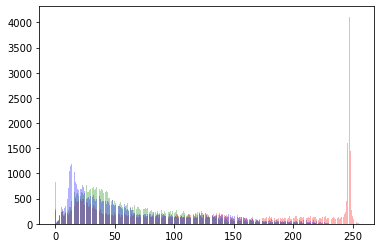

In [97]:
img = load_img(filelist[0], target_size=(224,224))
histogram = img.histogram()
print(histogram)
red = histogram[0:256]
green = histogram[256:512]
blue = histogram[512:768]
for i in range(0, 256):
    plt.bar(i, red[i], color = 'red', alpha=0.3)
    plt.bar(i, green[i], color = 'green',alpha=0.3)
    plt.bar(i, blue[i], color = 'blue', alpha=0.3)
plt.show()

In [98]:
def extract_histcolor_features(filename):
    img = load_img(filename, target_size=(224,224))
    return img.histogram()

In [99]:
from IPython.display import clear_output
import numpy as np
data = {}

n=len(filelist)
# loop through each image in the dataset
for i in range(n):
    # try to extract the features and update the dictionary
    clear_output(wait=True)
    print("Processing "+ str(i)+'/'+str(len(filelist)) + ": " + filelist[i])
    feat = extract_histcolor_features(filelist[i])
    data[filelist[i]] = feat
 
filenames = np.array(list(data.keys()))

# get a list of just the features
feat = np.array(list(data.values()))
print(feat.shape)
print(feat)

Processing 209/210: ../data/flower_images/0210.png
(210, 768)
[[ 821   18   38 ...    0    0    0]
 [ 456   15   16 ...  449  265  137]
 [ 234    0    6 ...    0    0    0]
 ...
 [1364  276  871 ...  207  287  542]
 [  21    0    4 ...   46    8    7]
 [ 285   26   17 ...    0    0    0]]


In [100]:
#clustering based on colors
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=len(unique_labels))
kmeans.fit(feat)
predicted_labels = kmeans.labels_
print(predicted_labels)

[4 7 6 2 5 8 3 7 7 3 0 7 2 9 6 2 2 3 0 2 8 3 2 1 8 2 6 2 8 2 2 4 4 1 4 7 4
 2 5 0 2 4 0 2 7 4 3 0 2 7 2 1 8 2 2 2 2 7 4 7 5 7 2 3 0 4 2 2 8 3 2 8 2 2
 4 2 2 1 7 8 5 3 8 2 7 2 6 3 8 3 2 2 0 6 7 4 4 2 4 2 7 6 1 2 2 6 7 2 7 2 2
 1 6 2 8 0 7 2 8 7 2 6 3 1 0 2 8 7 7 2 2 8 2 3 1 7 2 4 6 3 8 4 8 4 8 2 3 1
 8 8 6 3 0 4 0 2 6 4 8 0 1 2 8 6 7 8 2 0 0 8 0 0 8 0 4 3 2 1 8 6 7 4 7 8 2
 4 4 7 2 1 4 6 7 2 7 1 4 8 8 1 8 2 4 0 4 8 7 3 2 8]


Label 0:


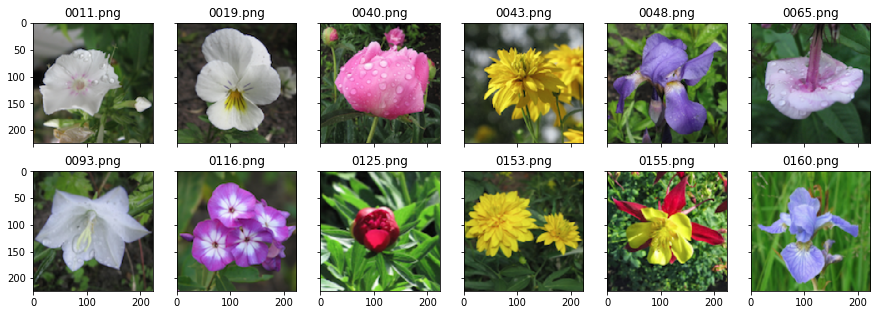

Label 1:


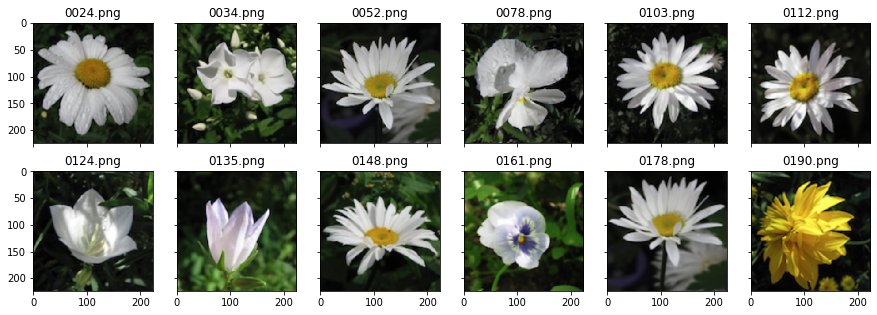

Label 2:


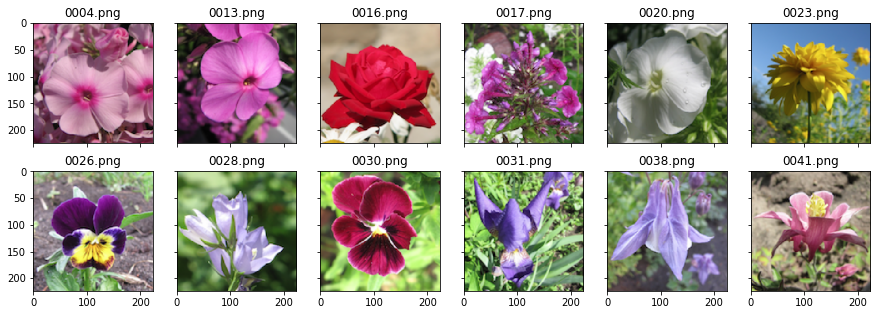

Label 3:


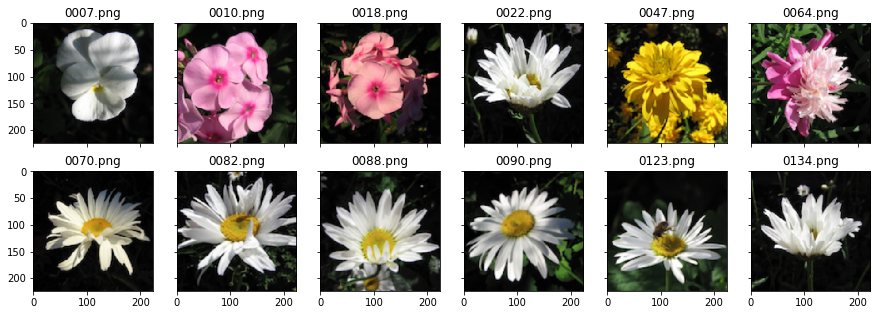

Label 4:


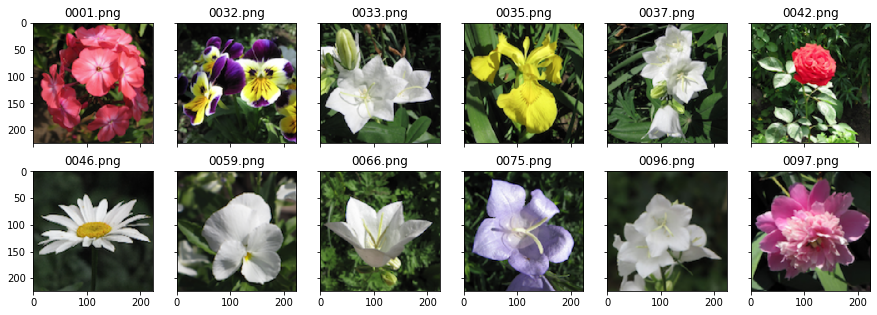

Label 5:


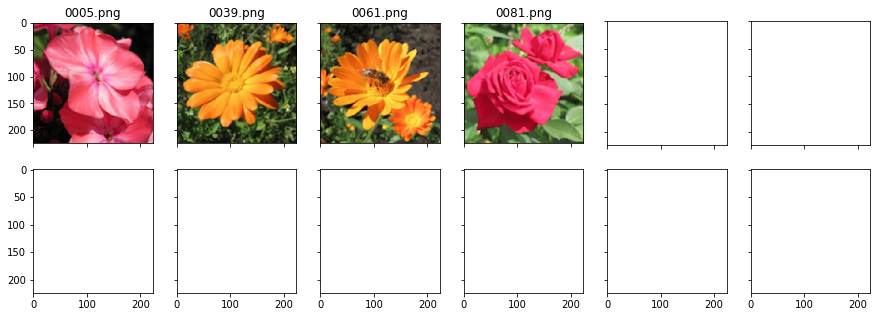

Label 6:


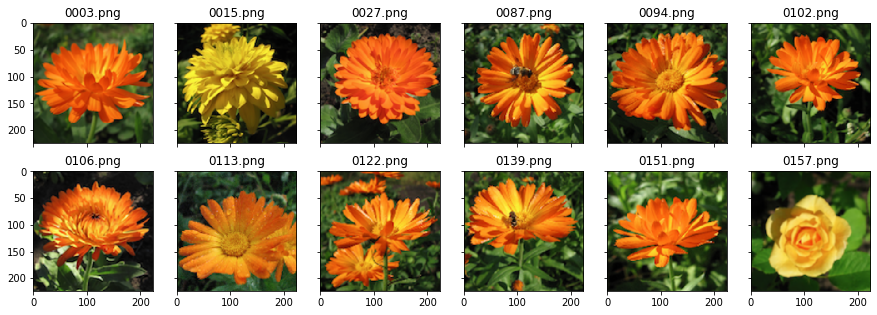

Label 7:


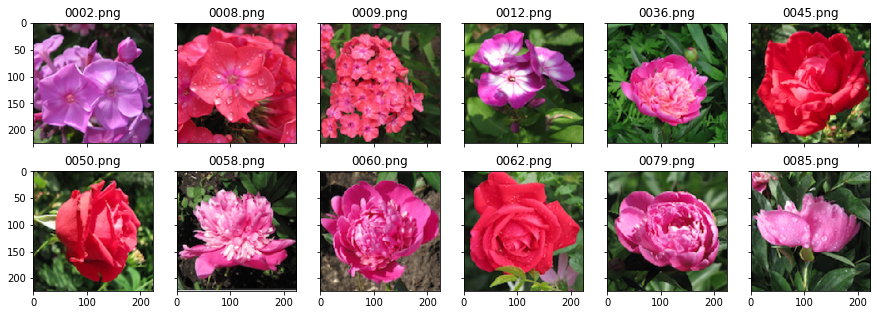

Label 8:


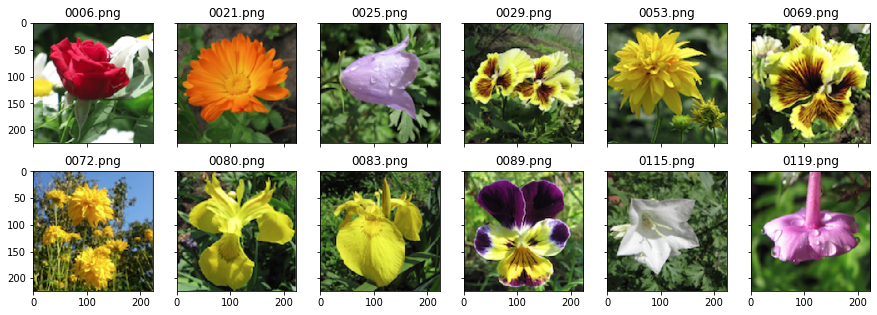

Label 9:


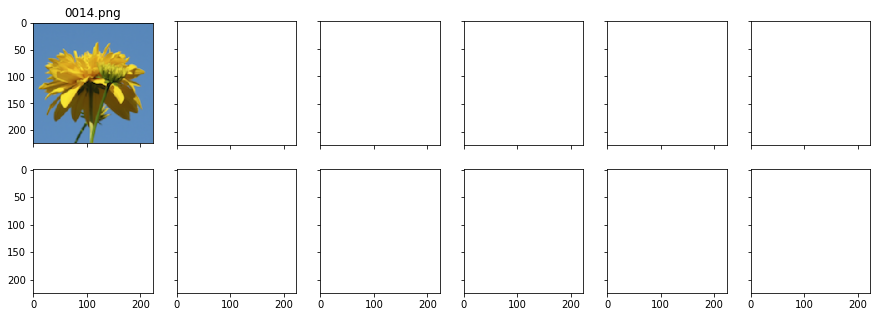

In [101]:
for c in unique_labels:
    print("Label {}:".format(c))
    filtered_list = [filelist[i] for i in range(len(filelist)) if predicted_labels[i]==c]
    show_mul_imgs(filtered_list)


Điểm rõ nét nhất có thể nhận ra là tốc độ gom cụm bây giờ khá nhanh. Tuy nhiên kết quả clustering có vẻ không tốt. Chúng ta thử đánh giá dùng các độ đo và dựa vào labels đã có.


In [103]:
eval_clusters()


Rand score: 0.8118478013214855
Adjusted RS: 0.12535213009186144
Adjusted MI: 0.24515518486451568


Kết quả này kém hơn so với dùng dữ liệu thô. 

Chúng ta sẽ thử các dạng features khác...

Để thuận tiện, ta sẽ tự động hóa các bước trong quy trình trích xuất đặc trưng, gom cụm, và đánh giá 

In [105]:
from IPython.display import clear_output
import numpy as np

#thử các features khác

def img2features(extraction_method):
    data = {}
    n=len(filelist)
    print("***Extracting features***")
    for i in range(n):
        # try to extract the features and update the dictionary
        clear_output(wait=True)
        print("Processing "+ str(i)+'/'+str(len(filelist)) + ": " + filelist[i])
        feat = extraction_method(filelist[i])
        data[filelist[i]] = feat
    feat = np.array(list(data.values()))
    return feat
    

def dotest(features, display=True):
    print("***Clustering***")
    kmeans = KMeans(n_clusters=len(unique_labels))
    kmeans.fit(features)
    predicted_labels = kmeans.labels_
    print("***Evaluation***")
    print("Rand score: {}".format(metrics.rand_score(labels, predicted_labels)))
    print("Adjusted RS: {}".format(metrics.adjusted_rand_score(labels, predicted_labels)))
    print("Adjusted MI: {}".format(metrics.adjusted_mutual_info_score(labels, predicted_labels)))
    if display:
        print("***Visualization***")
        for c in unique_labels:
            print("Label {}:".format(c))
            filtered_list = [filelist[i] for i in range(len(filelist)) if predicted_labels[i]==c]
            show_mul_imgs(filtered_list)
    return
    

## 3.2. Sử dụng đặc trưng khác

In [109]:
#chỉ lấy 1 sắc (đỏ)
def extract_Red(filename):
    img = load_img(filename, target_size=(224,224))
    histogram = img.histogram()
    red = histogram[0:256]
    green = histogram[256:512]
    blue = histogram[512:768]
    return red


dotest(features=img2features(extract_Red), display=False)

Processing 209/210: ../data/flower_images/0210.png
***Clustering***
***Evaluation***
Rand score: 0.8130325814536341
Adjusted RS: 0.07641898734765394
Adjusted MI: 0.15988785125742383


In [111]:
#chỉ lấy 1 sắc lục
def extract_Green(filename):
    img = load_img(filename, target_size=(224,224))
    histogram = img.histogram()
    red = histogram[0:256]
    green = histogram[256:512]
    blue = histogram[512:768]
    return green

dotest(features=img2features(extract_Green), display=False)

Processing 209/210: ../data/flower_images/0210.png
***Clustering***
***Evaluation***
Rand score: 0.7974025974025974
Adjusted RS: 0.09593632810128475
Adjusted MI: 0.17051034509271443


In [112]:
#chỉ lấy 1 sắc xanh
def extract_Blue(filename):
    img = load_img(filename, target_size=(224,224))
    histogram = img.histogram()
    red = histogram[0:256]
    green = histogram[256:512]
    blue = histogram[512:768]
    return blue

dotest(features=img2features(extract_Blue), display=False)

Processing 209/210: ../data/flower_images/0210.png
***Clustering***
***Evaluation***
Rand score: 0.8065162907268171
Adjusted RS: 0.07617329108288545
Adjusted MI: 0.16437361867792355


Đề xuất giải pháp nào khác để lấy đặc trưng, ngoài đặc trưng màu sắc?
Ví dụ: hình dáng, góc cạnh,... 

Ở trên chúng ta tìm cách trích xuất các đặc trưng từ dữ liệu một cách thủ công.
Các giải pháp này hiệu quả hay không là do đặc trưng phản ánh được bản chất dữ liệu hay không.
Liệu có cách tìm các đặc trưng một cách tự động và hiệu quả?

# 4 Giải pháp dựa trên Deep Learning - Trích xuất đặc trưng tự động 

Deep Learning cho thị giác máy tính -- CNN

In [113]:
from keras.applications.vgg16 import VGG16
from keras.models import Model
# load model
#model = VGG16() # download pre-trained file ~550MB and store in ~/.keras/models
model = VGG16(weights='../pretrainedModels/vgg16_weights_tf_dim_ordering_tf_kernels.h5') 
# remove the output layer
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
print(model.summary())

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [114]:
import numpy as np
from keras.applications.vgg16 import preprocess_input

# load the image as a 224x224 array
img = load_img(filelist[0], target_size=(224,224))
# convert from 'PIL.Image.Image' to numpy array
img = np.array(img)
print("Original file: " + str(img.shape))
reshaped_img = img.reshape(1,224,224,3)
print("After reshaped: " + str(reshaped_img.shape))
imgx = preprocess_input(reshaped_img)
print("After preprocessed: " + str(imgx.shape))
features = model.predict(imgx, use_multiprocessing=True)
print("Extracted features: " + str(features.shape))

Original file: (224, 224, 3)
After reshaped: (1, 224, 224, 3)
After preprocessed: (1, 224, 224, 3)
Extracted features: (1, 4096)


In [115]:
def deep_extract(file):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

features = img2features(deep_extract)

Processing 209/210: ../data/flower_images/0210.png


In [116]:
print(features.shape)

(210, 1, 4096)


In [117]:
features = features.reshape(features.shape[0],features.shape[2])
print(features.shape)

(210, 4096)


***Clustering***
***Evaluation***
Rand score: 0.8846206425153793
Adjusted RS: 0.4187911145888621
Adjusted MI: 0.565646771534841
***Visualization***
Label 0:


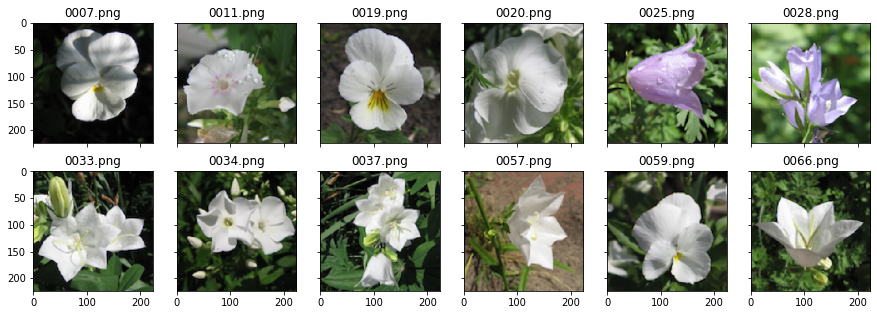

Label 1:


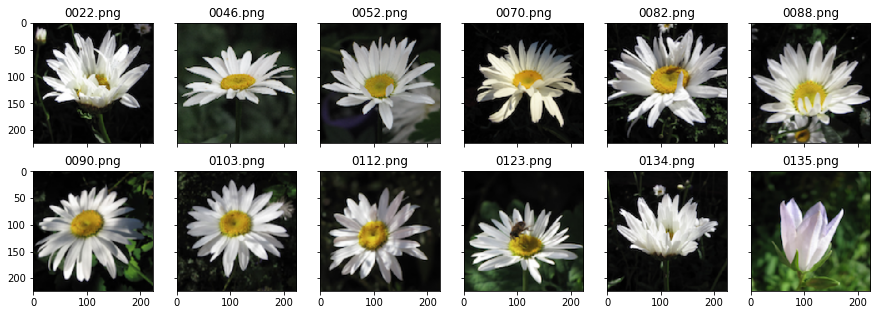

Label 2:


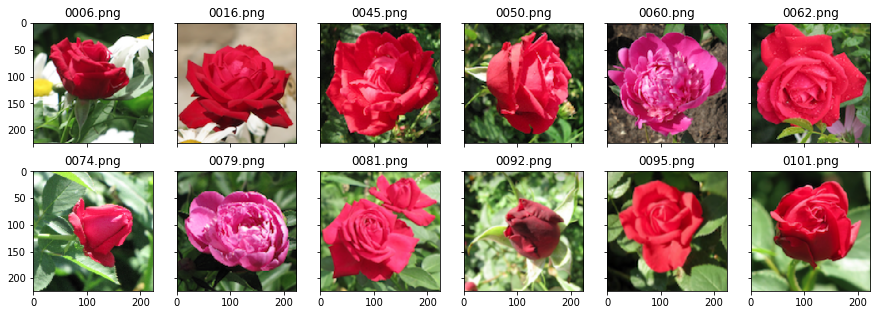

Label 3:


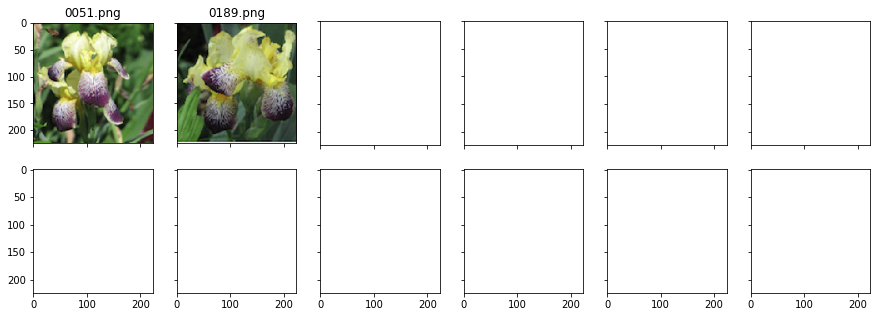

Label 4:


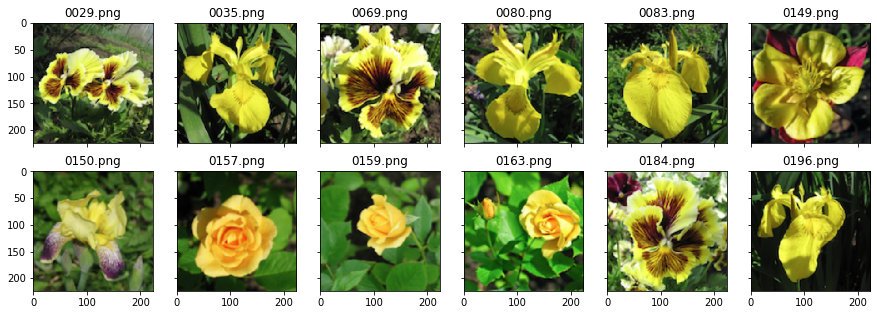

Label 5:


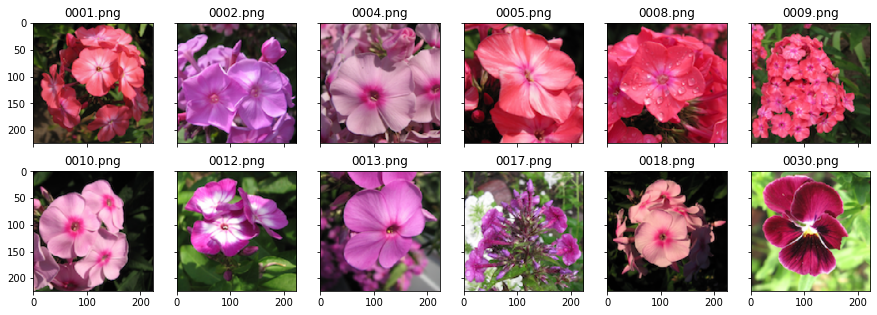

Label 6:


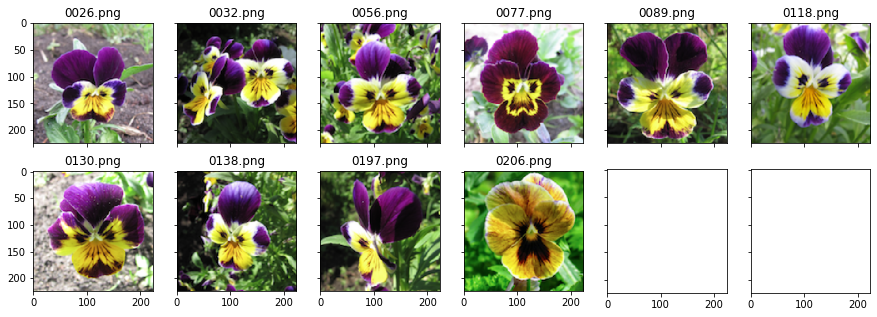

Label 7:


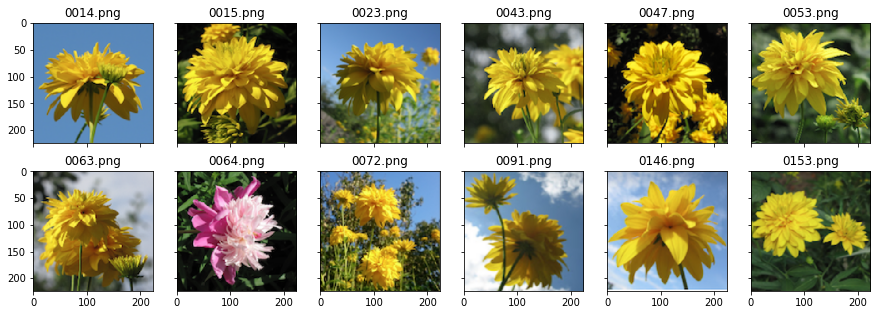

Label 8:


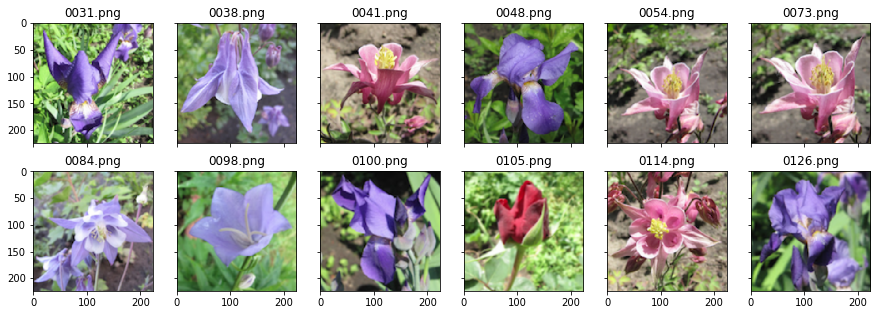

Label 9:


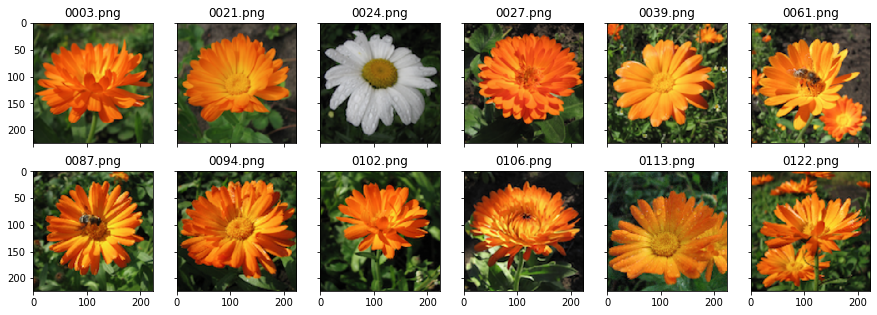

In [118]:
dotest(features)

Liệu số features là 4096 có thừa? Thử rút gọn bớt features bằng PCA

In [119]:
from sklearn.decomposition import PCA

pca = PCA(n_components=100)
pca.fit(features)
x = pca.transform(features)
print(x.shape)

(210, 100)


In [120]:
dotest(x, display=False)

***Clustering***
***Evaluation***
Rand score: 0.9092276144907724
Adjusted RS: 0.5144185060738176
Adjusted MI: 0.6375506467489407


In [121]:
pca = PCA(n_components=1)
pca.fit(features)
x = pca.transform(features)
print(x.shape)
dotest(x, display=False)

(210, 1)
***Clustering***
***Evaluation***
Rand score: 0.8169970380496696
Adjusted RS: 0.1322890925133283
Adjusted MI: 0.2882848088015977


In [122]:
pca = PCA(n_components=10)
pca.fit(features)
x = pca.transform(features)
print(x.shape)
dotest(x, display=False)

(210, 10)
***Clustering***
***Evaluation***
Rand score: 0.907177033492823
Adjusted RS: 0.5023759169614793
Adjusted MI: 0.6297337854354345


Câu hỏi: Chọn số features như thế nào là hợp lý